In [1]:
from pyedflib import highlevel
import pyedflib as plib
import numpy as np
import matplotlib.pyplot as plt
import statistics as stat

def read_file_signal(file_path, index):
    f = plib.EdfReader(file_path)
    signal = f.readSignal(index)
    f.close()
    return signal

def signal_labels(file_path):
    f = plib.EdfReader(file_path)
    labels = f.getSignalLabels()
    f.close()
    return labels

def combined_signal(file_list, index):
    combined_signals = []
    for file in file_list:
        temp = read_file_signal(file, index)
        combined_signals.append(temp)
    return np.concatenate(combined_signals)

def plot_signal(label, signal):
    plt.figure(figsize=(20, 10))
    plt.plot(signal)
    plt.title(f"{label} signal")
    plt.xlabel("time")
    plt.ylabel("amplitude")
    # plt.ylim(-300, 300)
    plt.show()

def thresholding(signal, threshold):
    mean = signal.mean()
    std = np.std(signal)
    lower_limit = mean - threshold * std
    upper_limit = mean + threshold * std
    filtered_signal = np.where((signal >= lower_limit) & (signal <= upper_limit), signal, mean)
    return filtered_signal

def resample_signal(signal, num_samples):
    original_indices = np.linspace(0, len(signal) - 1, num=len(signal))
    resampled_indices = np.linspace(0, len(signal) - 1, num=num_samples)
    resampled_signal = np.interp(resampled_indices, original_indices, signal)
    return resampled_signal

def mean_of_interval(signal, start, end):
    return stat.mean(signal[start:end])

edf_files_1 = [
    "c:\\Users\\anany\\Downloads\\00000349-297469[001].edf",
    "c:\\Users\\anany\\Downloads\\00000349-297469[002].edf",
    "c:\\Users\\anany\\Downloads\\00000349-297469[003].edf",
    "c:\\Users\\anany\\Downloads\\00000349-297469[004].edf",
    "c:\\Users\\anany\\Downloads\\00000349-297469[005].edf",
    "c:\\Users\\anany\\Downloads\\00000349-297469[006].edf",
    "c:\\Users\\anany\\Downloads\\00000349-297469[007].edf",
    "c:\\Users\\anany\\Downloads\\00000349-297469[008].edf",
    "c:\\Users\\anany\\Downloads\\00000349-297469[009].edf",
    "c:\\Users\\anany\\Downloads\\00000349-297469[010].edf"
]

edf_files_2 = [
    "C:\\Users\\anany\\Downloads\\00000344-297469[001].edf",
    "C:\\Users\\anany\\Downloads\\00000344-297469[002].edf",
    "C:\\Users\\anany\\Downloads\\00000344-297469[003].edf",
    "C:\\Users\\anany\\Downloads\\00000344-297469[004].edf",
    "C:\\Users\\anany\\Downloads\\00000344-297469[005].edf",
    "C:\\Users\\anany\\Downloads\\00000344-297469[006].edf",
    "C:\\Users\\anany\\Downloads\\00000344-297469[007].edf",
    "C:\\Users\\anany\\Downloads\\00000344-297469[008].edf"
]

edf_files_3 = [
    "C:\\Users\\anany\\Downloads\\00000338-297469[001].edf",
    "C:\\Users\\anany\\Downloads\\00000338-297469[002].edf",
    "C:\\Users\\anany\\Downloads\\00000338-297469[003].edf",
    "C:\\Users\\anany\\Downloads\\00000338-297469[004].edf",
    "C:\\Users\\anany\\Downloads\\00000338-297469[005].edf",
    "C:\\Users\\anany\\Downloads\\00000338-297469[006].edf",
    "C:\\Users\\anany\\Downloads\\00000338-297469[007].edf",
    "C:\\Users\\anany\\Downloads\\00000338-297469[008].edf",
    "C:\\Users\\anany\\Downloads\\00000338-297469[009].edf",
    "C:\\Users\\anany\\Downloads\\00000338-297469[010].edf",
    "C:\\Users\\anany\\Downloads\\00000338-297469[011].edf"
]

edf_files_4 = [
    "C:\\Users\\anany\\Downloads\\00000336-297469[001].edf",
    "C:\\Users\\anany\\Downloads\\00000336-297469[002].edf",
    "C:\\Users\\anany\\Downloads\\00000336-297469[003].edf",
    "C:\\Users\\anany\\Downloads\\00000336-297469[004].edf",
    "C:\\Users\\anany\\Downloads\\00000336-297469[005].edf",
    "C:\\Users\\anany\\Downloads\\00000336-297469[006].edf",
    "C:\\Users\\anany\\Downloads\\00000336-297469[007].edf",
    "C:\\Users\\anany\\Downloads\\00000336-297469[008].edf",
    "C:\\Users\\anany\\Downloads\\00000336-297469[009].edf",
    "C:\\Users\\anany\\Downloads\\00000336-297469[010].edf",
    "C:\\Users\\anany\\Downloads\\00000336-297469[011].edf"
]

labels = signal_labels(edf_files_1[0])
labels[16] = "Flow patient 1"
labels[17] = "Flow patient 2"
labels[23] = "Flow patient 3"
print(labels)

['EEG F3-A2', 'EEG F4-A1', 'EEG A1-A2', 'EEG C3-A2', 'EEG C4-A1', 'EEG O1-A2', 'EEG O2-A1', 'EOG LOC-A2', 'EOG ROC-A1', 'EMG Chin', 'Leg 1', 'Leg 2', 'ECG I', 'RR', 'ECG II', 'Snore', 'Flow patient 1', 'Flow patient 2', 'Effort THO', 'Effort ABD', 'SpO2', 'Pleth', 'Body', 'Flow patient 3', 'xPAP CPAP', 'xPAP IPAP', 'xPAP EPAP', 'Leak Total', 'PulseRate', 'PressCheck', 'ECG IIHF', 'Technical']


In [8]:
import xml.etree.ElementTree as ET

# Function to parse the XML and print stages
file_path = 'C:\\Users\\anany\\Desktop\\OSA\\user_mild_336.rml'
    # Parse the XML file
tree = ET.parse(file_path)
root = tree.getroot()

# Iterate through each Stage element in the XML
for stage in root.findall('.//User/Stage'):
    stage_type = stage.get('Type')  # Get the 'Type' attribute
    start_time = stage.get('Start')  # Get the 'Start' attribute
    
    # Print the stage type and start time
    print(f'Stage Type: {stage_type}, Start: {start_time}')

Stage Type: Wake, Start: 0
Stage Type: NonREM1, Start: 1980
Stage Type: Wake, Start: 2610
Stage Type: NonREM1, Start: 2730
Stage Type: Wake, Start: 2790
Stage Type: NonREM1, Start: 2850
Stage Type: NonREM2, Start: 3060
Stage Type: NonREM3, Start: 3840
Stage Type: Wake, Start: 4890
Stage Type: NonREM1, Start: 5070
Stage Type: Wake, Start: 5220
Stage Type: NonREM1, Start: 5640
Stage Type: Wake, Start: 5880
Stage Type: NonREM1, Start: 6360
Stage Type: NonREM2, Start: 6540
Stage Type: NonREM3, Start: 8100
Stage Type: Wake, Start: 8250
Stage Type: NonREM2, Start: 8310
Stage Type: NonREM3, Start: 8580
Stage Type: NonREM2, Start: 8790
Stage Type: NonREM3, Start: 8970
Stage Type: NonREM2, Start: 9240
Stage Type: NonREM3, Start: 9480
Stage Type: Wake, Start: 10110
Stage Type: NonREM2, Start: 10200
Stage Type: Wake, Start: 10380
Stage Type: NonREM2, Start: 10590
Stage Type: NonREM3, Start: 10830
Stage Type: Wake, Start: 11580
Stage Type: NonREM1, Start: 11640
Stage Type: NonREM3, Start: 11760
St

In [4]:
def find_intervals_user(type, root):
    time_intervals = []
    time_pair = []
    for stage in root.findall('.//User/Stage'):
        stage_type = stage.get('Type')
        start_time = int(stage.get('Start'))

        if stage_type in type:
            if len(time_pair) == 0:
                time_pair.append(start_time)
        else:
            if len(time_pair) == 1:
                time_pair.append(start_time)
                time_intervals.append(time_pair)
                time_pair = []

    return time_intervals

In [5]:
user_wake_times = find_intervals_user(['Wake'], root)
print(user_wake_times)

[[0, 360], [600, 750], [11130, 11670], [19260, 19320], [20190, 20250], [21060, 21090], [22410, 22470], [23040, 23070], [24600, 24690], [26310, 26400], [27180, 27300], [30390, 30450], [32250, 32310]]


In [6]:
user_sleep_times = find_intervals_user(['NonREM1', 'NonREM2', 'NonREM3', 'REM'], root)
print(user_sleep_times)

[[360, 600], [750, 11130], [11670, 15420], [19110, 19260], [19320, 20190], [20250, 21060], [21090, 22410], [22470, 23040], [23070, 24600], [24690, 26310], [26400, 27180], [27300, 30390], [30450, 32250]]


In [7]:
# def divide_hourly(hour, root):
#     hourly_data = {}
#     for stage in root.findall('.//User/Stage'):
#         stage_type = stage.get('Type')           
#         start_time = int(stage.get('Start'))
#         # print(start_time)
#         # print(stage_type)
#         if start_time < hour*3600 and start_time >= (hour-1)*3600:
#             if stage_type in hourly_data:
#                 hourly_data[stage_type] += 1
#             else:
#                 hourly_data[stage_type] = 1
#     return hourly_data
                

# hourly_data = divide_hourly(1, root)
# print(f"1:{hourly_data}")

In [8]:
# for i in range(10):
#     hourly_data = divide_hourly(i+1, root)
#     total = 0
#     for key in hourly_data:
#         total += hourly_data[key]
#     print(f"{i+1}:{hourly_data}")
#     print(f"Total: {total}")

In [9]:
def count_stages_hourwise(root):
    hourly_data = {}
    for stage in root.findall('.//User/Stage'):
        stage_type = stage.get('Type')           
        start_time = int(stage.get('Start'))
        hour = start_time//3600
        if hour in hourly_data:
            if stage_type in hourly_data[hour]:
                hourly_data[hour][stage_type] += 1
            else:
                hourly_data[hour][stage_type] = 1
        else:
            hourly_data[hour] = {}
            hourly_data[hour][stage_type] = 1
    return hourly_data

In [10]:
hourly_data = count_stages_hourwise(root)
print(hourly_data)

{0: {'Wake': 2, 'NonREM1': 2, 'NonREM2': 1, 'NonREM3': 1}, 1: {'NonREM2': 4, 'NonREM3': 3, 'REM': 1}, 2: {'NonREM3': 2, 'NonREM2': 2, 'NonREM1': 1}, 3: {'Wake': 1, 'NonREM1': 2, 'NonREM2': 5, 'NonREM3': 5, 'REM': 1}, 4: {'REM': 2, 'NonREM3': 1, 'NotScored': 1}, 5: {'REM': 3, 'NonREM1': 2, 'Wake': 3, 'NonREM2': 3, 'NonREM3': 3}, 6: {'Wake': 3, 'REM': 2, 'NonREM3': 2, 'NonREM2': 2}, 7: {'NonREM1': 5, 'REM': 1, 'Wake': 2, 'NonREM2': 3, 'NonREM3': 1}, 8: {'Wake': 2, 'NonREM1': 1, 'NonREM2': 1, 'NonREM3': 1, 'REM': 2}, 9: {'NonREM2': 5, 'NonREM1': 4, 'REM': 2}}


In [11]:
for item in hourly_data:
    print(f"Hour {item}: {hourly_data[item]}")

Hour 0: {'Wake': 2, 'NonREM1': 2, 'NonREM2': 1, 'NonREM3': 1}
Hour 1: {'NonREM2': 4, 'NonREM3': 3, 'REM': 1}
Hour 2: {'NonREM3': 2, 'NonREM2': 2, 'NonREM1': 1}
Hour 3: {'Wake': 1, 'NonREM1': 2, 'NonREM2': 5, 'NonREM3': 5, 'REM': 1}
Hour 4: {'REM': 2, 'NonREM3': 1, 'NotScored': 1}
Hour 5: {'REM': 3, 'NonREM1': 2, 'Wake': 3, 'NonREM2': 3, 'NonREM3': 3}
Hour 6: {'Wake': 3, 'REM': 2, 'NonREM3': 2, 'NonREM2': 2}
Hour 7: {'NonREM1': 5, 'REM': 1, 'Wake': 2, 'NonREM2': 3, 'NonREM3': 1}
Hour 8: {'Wake': 2, 'NonREM1': 1, 'NonREM2': 1, 'NonREM3': 1, 'REM': 2}
Hour 9: {'NonREM2': 5, 'NonREM1': 4, 'REM': 2}


# analysing on snore data

In [12]:
snore_index = labels.index("Snore")
print(snore_index)

# snore_signal = read_file_signal(edf_files_1[0], snore_index)[360:11130]
snore_signal = combined_signal(edf_files_1, snore_index)
snore_signal_resampled = resample_signal(snore_signal, 36000)
snore_signal_threshold = thresholding(snore_signal_resampled, 2)
final_snore_signal = snore_signal_threshold[360:11130]
print(len(final_snore_signal))

15
10770


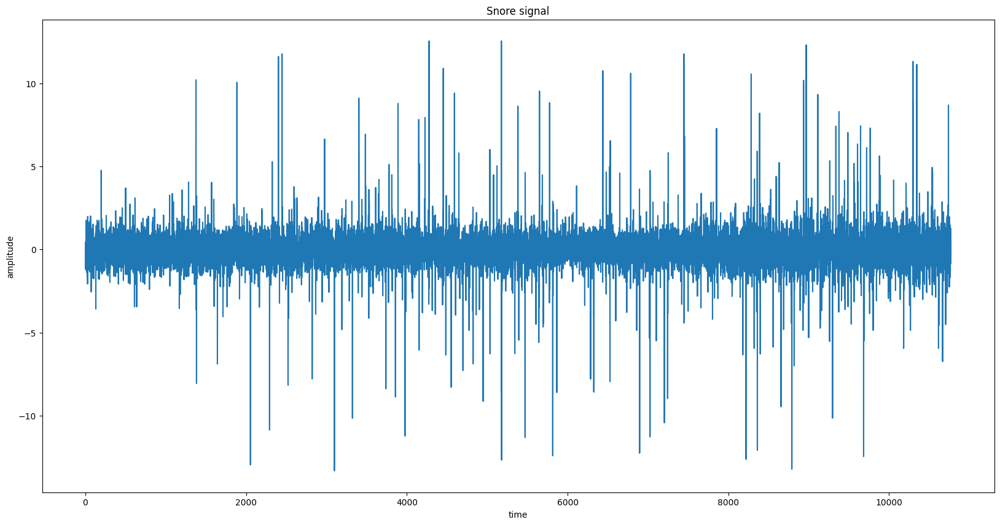

In [35]:
plot_signal("Snore", final_snore_signal)

In [36]:
v1 = np.var(final_snore_signal[0:240])
m1 = mean_of_interval(final_snore_signal, 0, 240)
v2 = np.var(final_snore_signal[240:390])
m2 = mean_of_interval(final_snore_signal, 240, 390)
v3 = np.var(final_snore_signal[390:10770])
m3 = mean_of_interval(final_snore_signal, 390, 10770)
print(f"Variance 1: {v1}, Mean 1: {m1}")
print(f"Variance 2: {v2}, Mean 2: {m2}")
print(f"Variance 3: {v3}, Mean 3: {m3}")

Variance 1: 0.9001033444769533, Mean 1: 0.01976523478260757
Variance 2: 0.6238077057245417, Mean 2: -0.013846088774110608
Variance 3: 1.6629576425097816, Mean 3: -0.021187780571723533


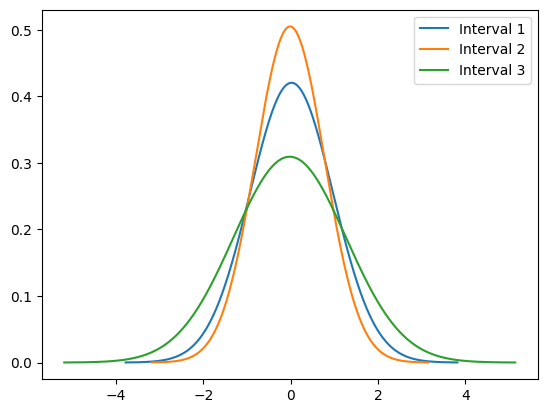

In [37]:
s1 = np.sqrt(v1)
s2 = np.sqrt(v2)
s3 = np.sqrt(v3)
x1 = np.linspace(m1 - 4*s1, m1 + 4*s1, 1000)
x2 = np.linspace(m2 - 4*s2, m2 + 4*s2, 1000)
x3 = np.linspace(m3 - 4*s3, m3 + 4*s3, 1000)
y1 = (1/(s1 * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x1 - m1)/s1)**2)
y2 = (1/(s2 * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x2 - m2)/s2)**2)
y3 = (1/(s3 * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x3 - m3)/s3)**2)
plt.plot(x1, y1, label="Interval 1")
plt.plot(x2, y2, label="Interval 2")
plt.plot(x3, y3, label="Interval 3")
plt.legend()

In [54]:
print(final_snore_signal[0:10])

[-1.08407303  0.08045361  0.42573341 -1.18360735  0.2274186   0.23127695
 -0.43613382  0.540532   -0.03182641  0.32627921]


In [19]:
! pip install hmmlearn


[notice] A new release of pip is available: 23.2.1 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [13]:
from hmmlearn.hmm import GaussianHMM, CategoricalHMM

def standardize_signal(signal):
    """
    Standardizes a signal using z-score normalization.

    Parameters:
        signal (numpy array): The input signal.

    Returns:
        standardized_signal (numpy array): The standardized signal.
    """
    mean = np.mean(signal)
    std_dev = np.std(signal)
    standardized_signal = (signal - mean) / std_dev
    return standardized_signal

def train_hmm(signal, states, iterations):
    signal = standardize_signal(signal)
    data = signal.reshape(-1, 1)
    model = GaussianHMM(n_components=states, covariance_type="diag", n_iter=iterations, random_state=42)
    model.fit(data)
    hidden_states = model.predict(data)
    return hidden_states    

def train_categorical_hmm_with_floats(signal, states, iterations, bins):
    # Step 1: Discretize the signal
    bin_edges = np.linspace(signal.min(), signal.max(), bins + 1)  # Create bin edges
    discrete_signal = np.digitize(signal, bin_edges) - 1  # Convert to categories (0 to bins-1)

    # Reshape to 2D array for HMM
    discrete_signal = discrete_signal.reshape(-1, 1)

    # Step 2: Train the CategoricalHMM
    model = CategoricalHMM(n_components=states, n_iter=iterations, random_state=42)
    model.fit(discrete_signal)

    # Step 3: Predict hidden states
    hidden_states = model.predict(discrete_signal)
    return hidden_states

def plot_hidden_states(hidden_states):
    plt.figure(figsize=(20, 10))
    plt.plot(hidden_states, label='Hidden States', linewidth=1, linestyle='--')   
    plt.title("Hidden states")
    plt.xlabel("time")
    plt.ylabel("amplitude")
    plt.show()

def plot_signal_hidden_states(signal, hidden_states):
    data = signal.reshape(-1, 1)
    plt.figure(figsize=(20, 10))
    for i in range(data.shape[1]):  
        plt.plot(data[:, i], label=f'Channel {i+1}')
    plt.plot(hidden_states, label='Hidden States', linestyle='--', linewidth=2)  
    plt.title("Signal with Hidden states")
    plt.xlabel("time")
    plt.ylabel("amplitude")
    plt.show()

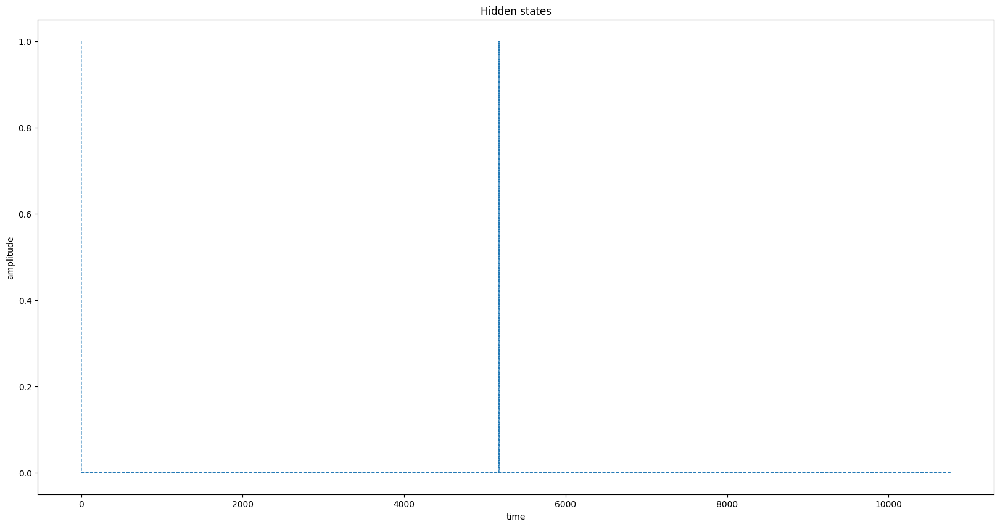

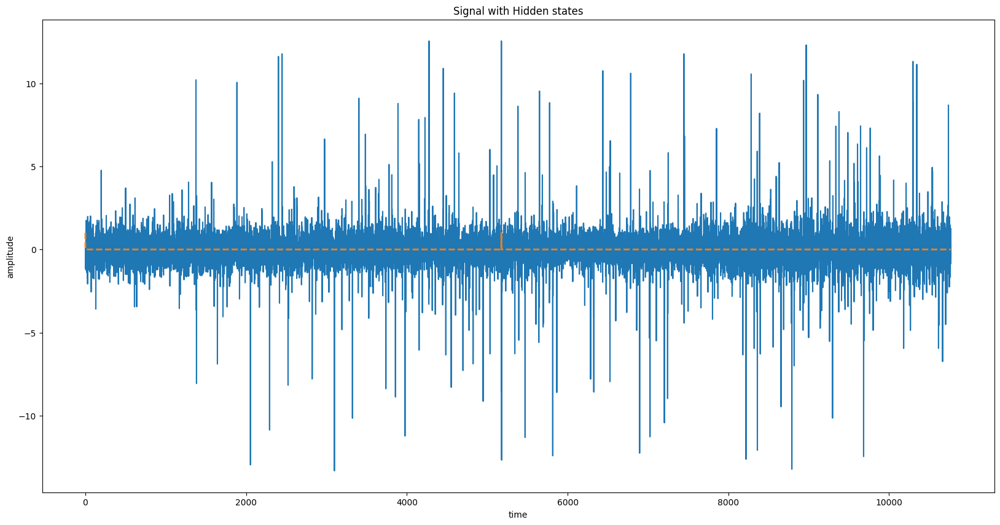

In [101]:
hidden_states = train_categorical_hmm_with_floats(final_snore_signal, 2, 1000, 5)
plot_hidden_states(hidden_states)
plot_signal_hidden_states(final_snore_signal, hidden_states)

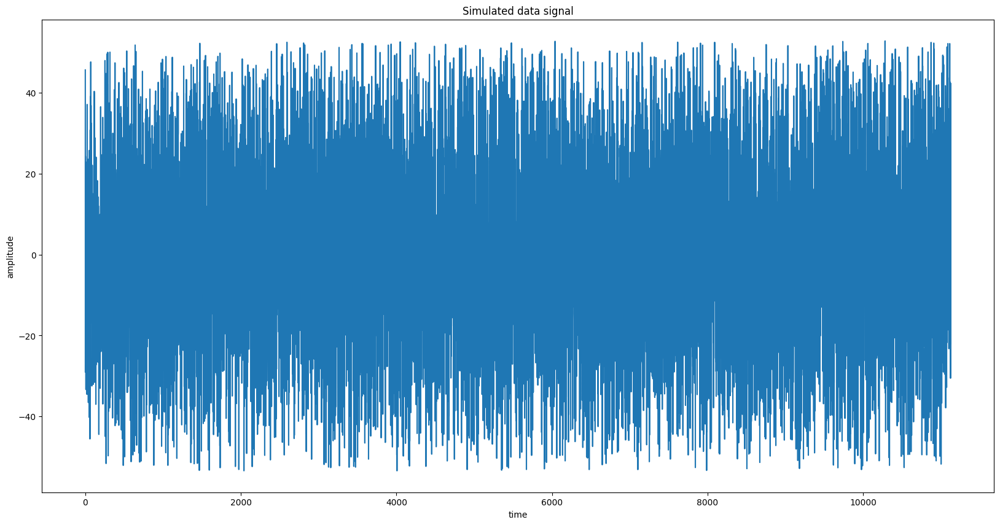

In [19]:
def simulate_data(mean, variance, num_samples):
    std_dev = np.sqrt(variance)  # Standard deviation
    simulated_data = np.random.normal(mean, std_dev, num_samples)
    return simulated_data

data = simulate_data(m1, v1, 240)
data = np.concatenate((data, simulate_data(m2, v2, 150)))
data = np.concatenate((data, simulate_data(m3, v3, 10740)))
thresholding_data = thresholding(data, 2)
plot_signal("Simulated data", thresholding_data)

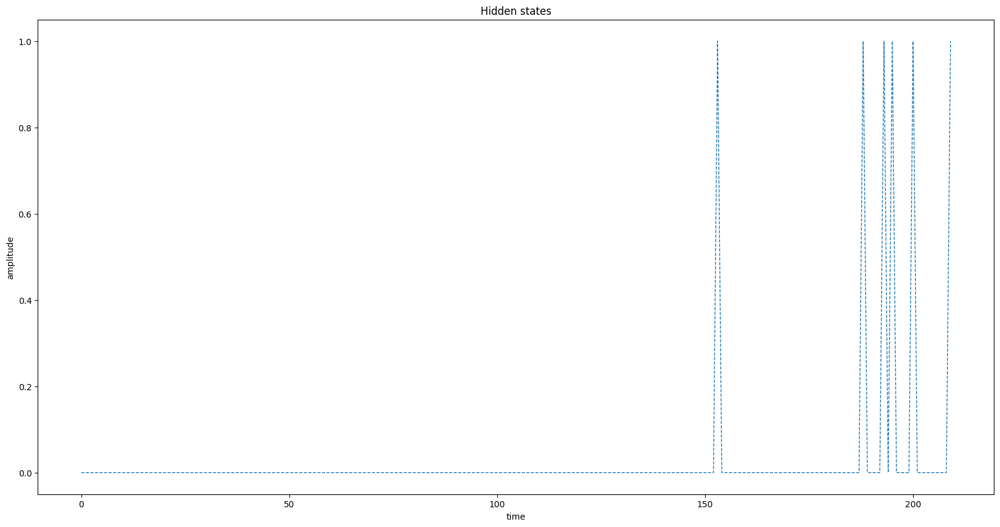

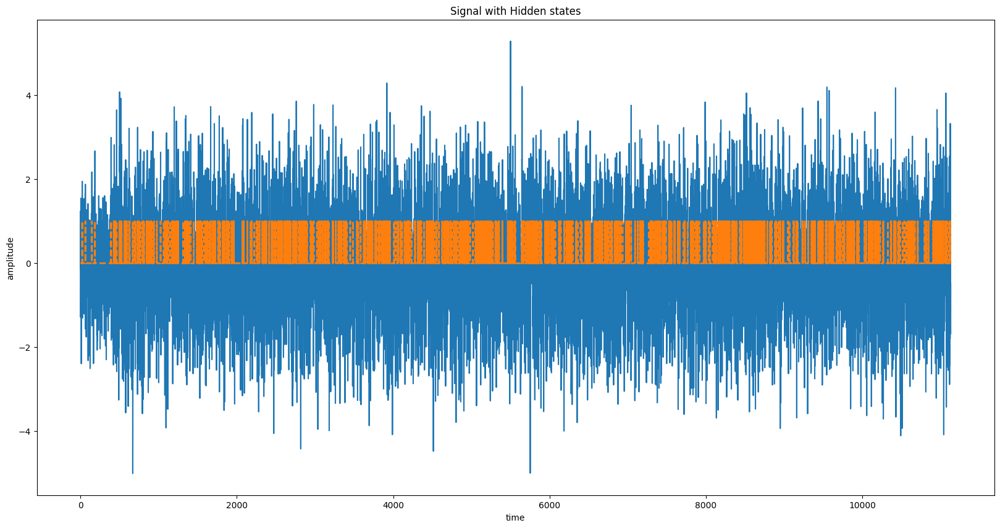

In [151]:
hidden_states_simulated = train_categorical_hmm_with_floats(data, 2, 1000, 12)
plot_hidden_states(hidden_states_simulated[240:450])
plot_signal_hidden_states(data, hidden_states_simulated)

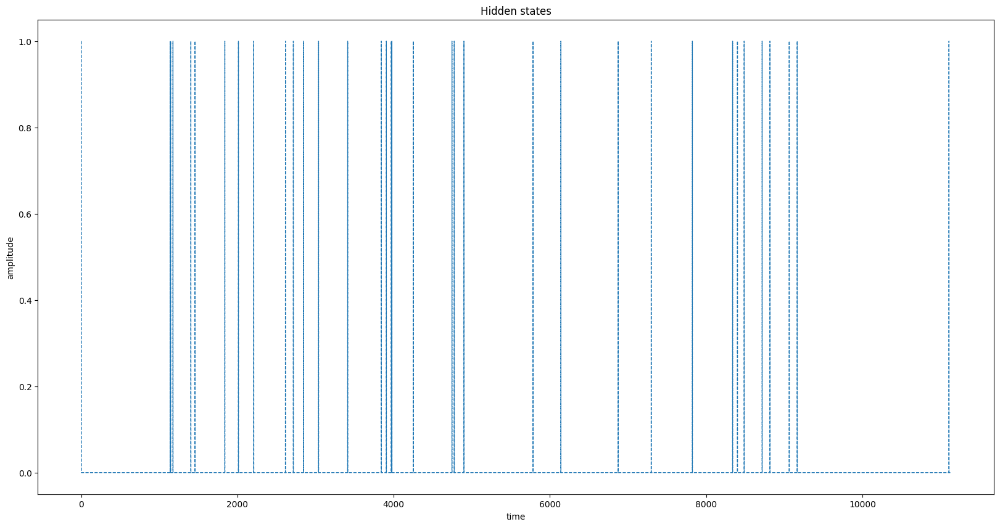

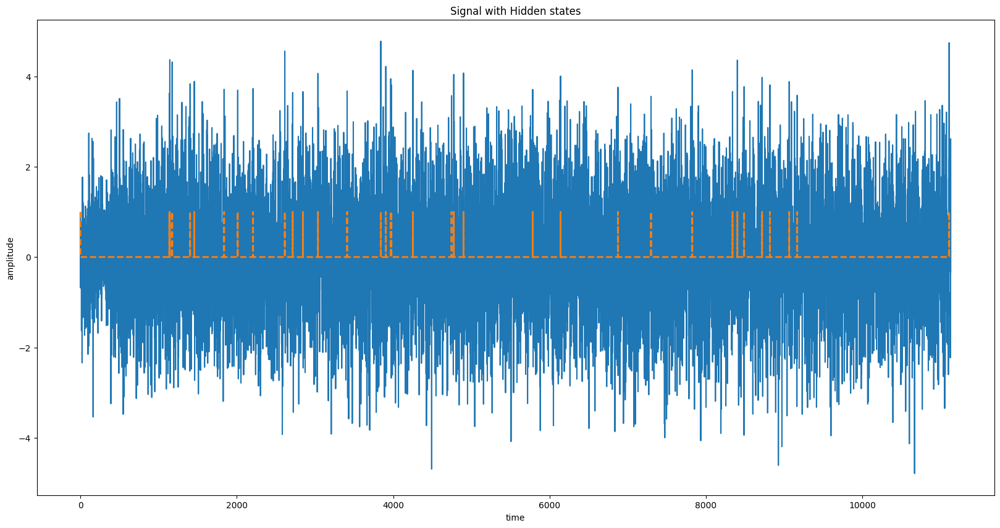

In [93]:
hidden_states_sim_2 = train_hmm(data, 2, 1000)  
plot_hidden_states(hidden_states_sim_2)
plot_signal_hidden_states(data, hidden_states_sim_2)

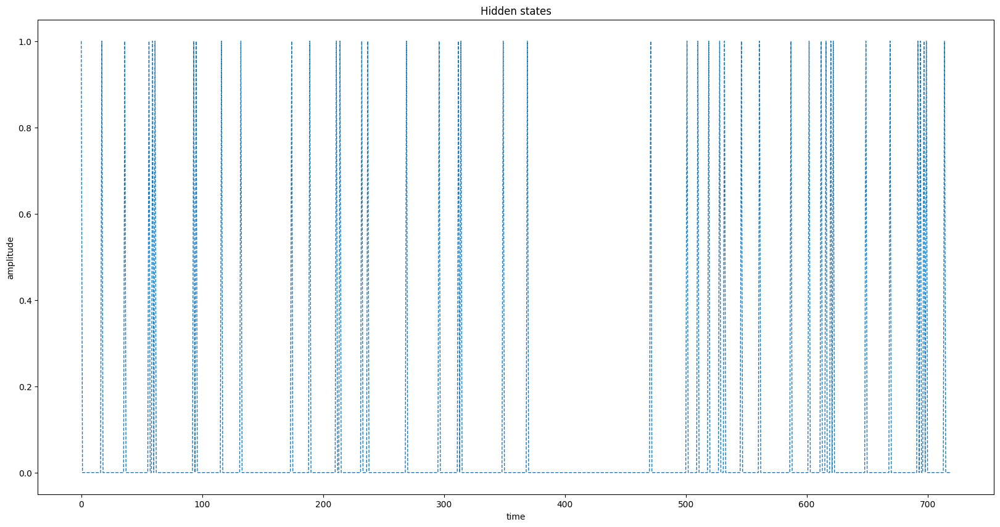

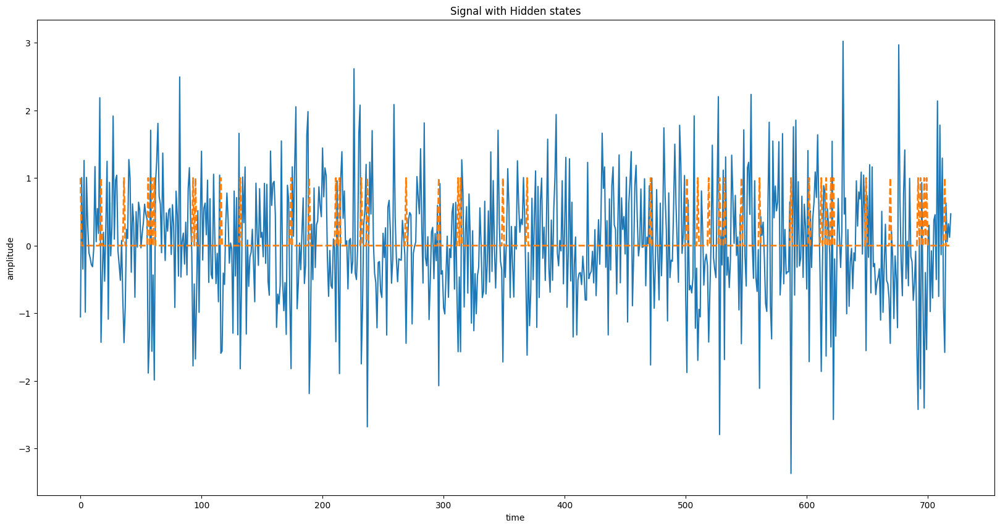

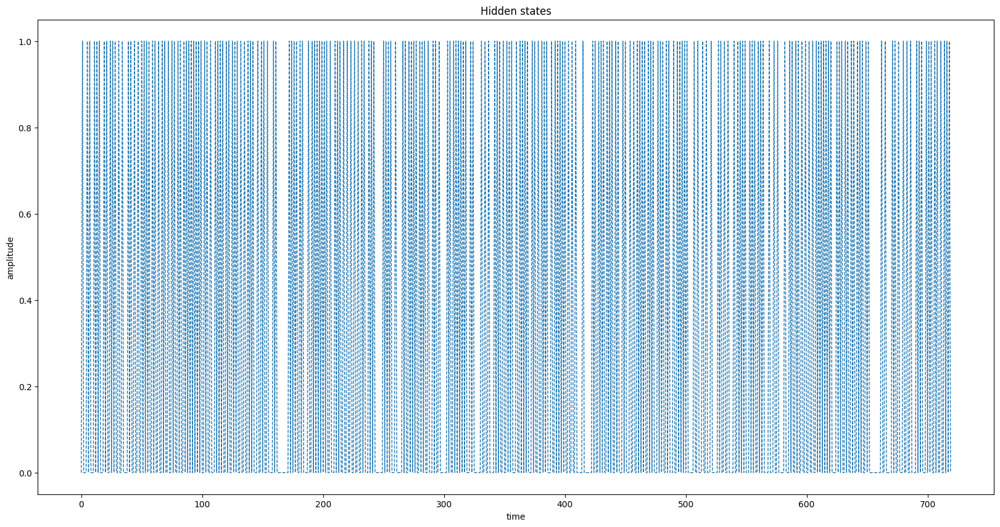

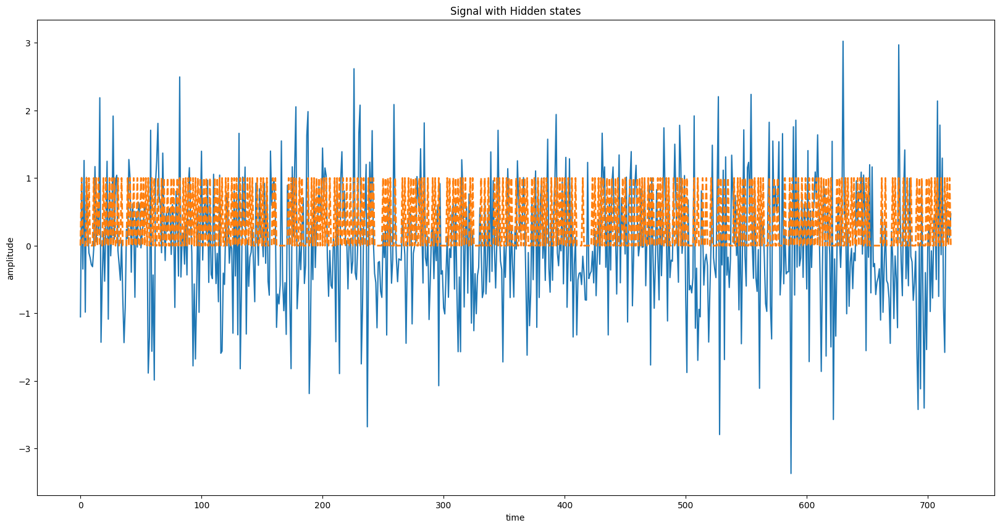

In [104]:
data2 = simulate_data(m1, v1, 240)
data2 = np.concatenate((data2, simulate_data(m2, v2, 240)))
data2 = np.concatenate((data2, simulate_data(m1, v1, 240)))

hidden_states_sim_3 = train_hmm(data2, 2, 1000)
plot_hidden_states(hidden_states_sim_3)
plot_signal_hidden_states(data2, hidden_states_sim_3)

hidden_states_sim_4 = train_categorical_hmm_with_floats(data2, 2, 1000, 10)
plot_hidden_states(hidden_states_sim_4)
plot_signal_hidden_states(data2, hidden_states_sim_4)

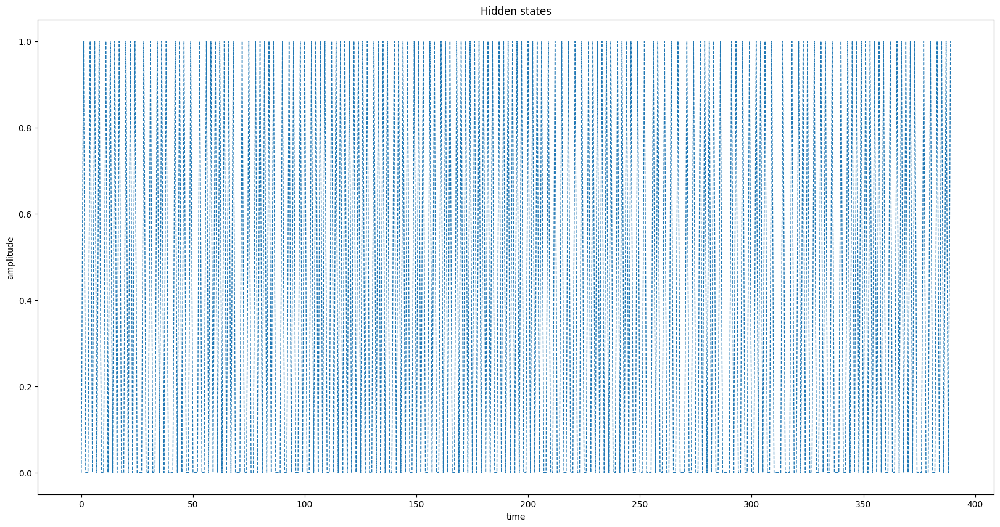

In [105]:
final_2 = snore_signal_threshold[0:390]

hidden_states_final = train_hmm(final_2, 2, 1000)
plot_hidden_states(hidden_states_final)

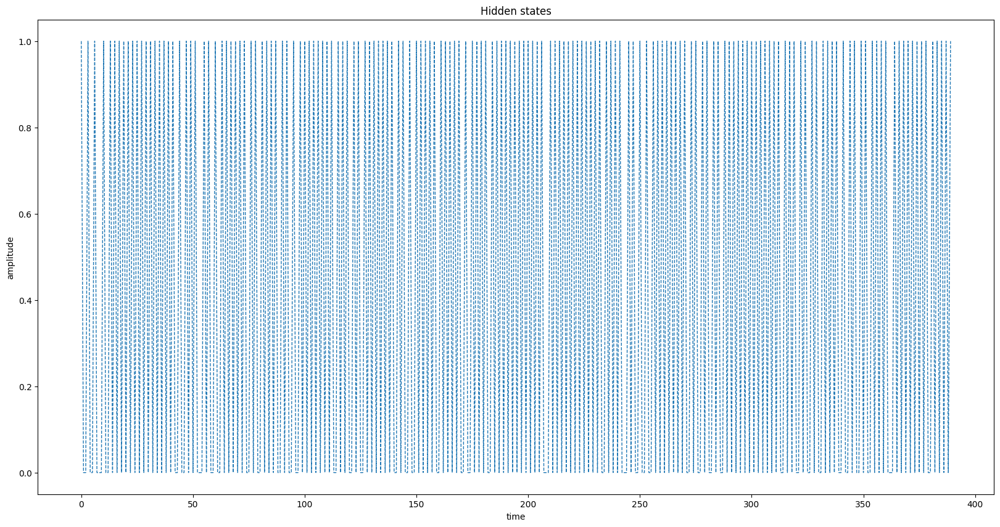

In [112]:
hidden_states_final_2 = train_categorical_hmm_with_floats(final_2, 2, 1000, 100)
plot_hidden_states(hidden_states_final_2)

In [114]:
test_data = np.ones(100)
test_data = np.concatenate((test_data, np.zeros(100)))
print(test_data)

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]


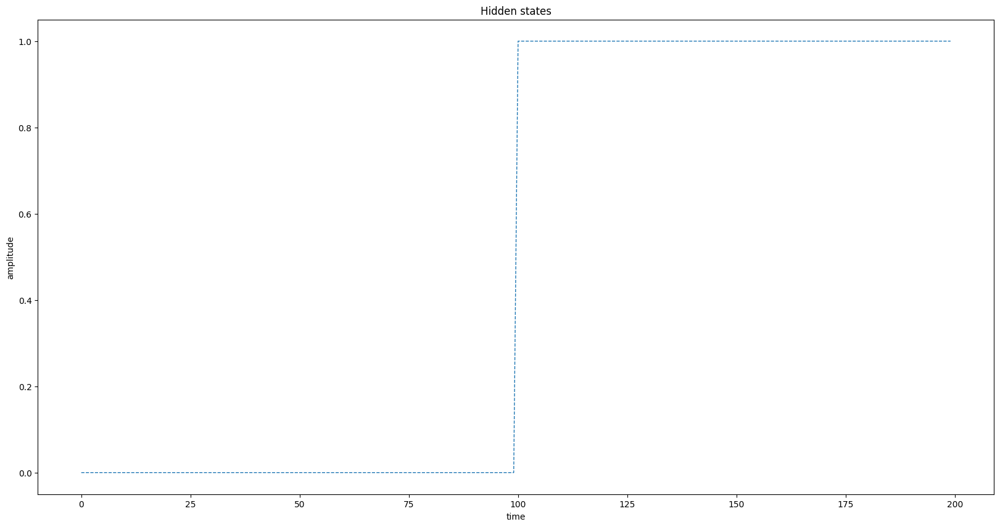

In [116]:
hidden_states = train_hmm(test_data, 2, 1000)
plot_hidden_states(hidden_states)

# smaller dataset

In [9]:
snore_index = labels.index("Snore")
print(snore_index)

# snore_signal = read_file_signal(edf_files_1[0], snore_index)[360:11130]
snore_signal_2 = combined_signal(edf_files_1, snore_index)
snore_signal_resampled_2 = resample_signal(snore_signal_2, 36000)
snore_signal_threshold_2 = thresholding(snore_signal_resampled_2, 2)
final_snore_signal_2 = snore_signal_threshold_2[0:1200]
print(len(final_snore_signal_2))

15
1200


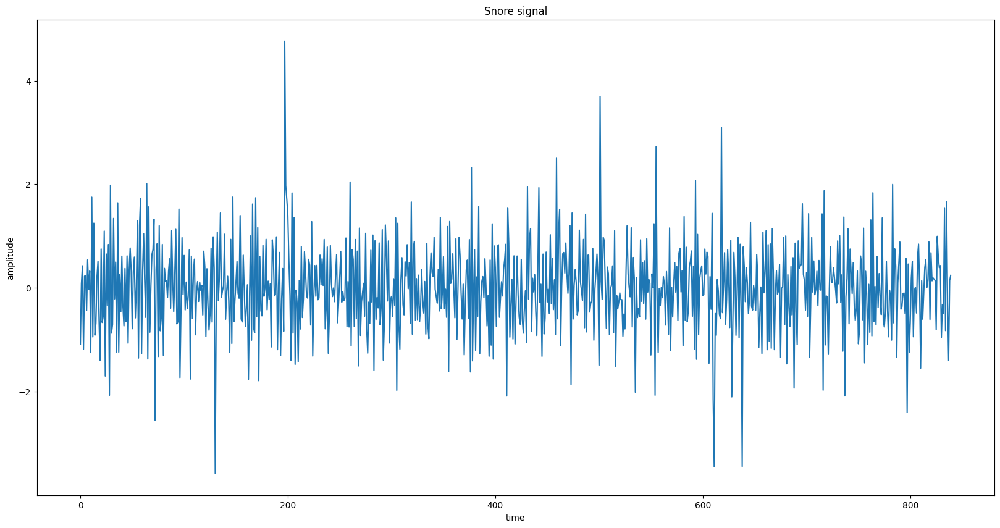

In [133]:
plot_signal("Snore", final_snore_signal)

In [134]:
v1 = np.var(final_snore_signal_2[0:360])
m1 = mean_of_interval(final_snore_signal_2, 0, 360)
v2 = np.var(final_snore_signal_2[360:600])
m2 = mean_of_interval(final_snore_signal_2, 360, 600)
v3 = np.var(final_snore_signal_2[600:750])
m3 = mean_of_interval(final_snore_signal_2, 600, 750)
v4 = np.var(final_snore_signal_2[750:1200])
m4 = mean_of_interval(final_snore_signal_2, 750, 1200)
print(f"Variance 1: {v1}, Mean 1: {m1}")
print(f"Variance 2: {v2}, Mean 2: {m2}")
print(f"Variance 3: {v3}, Mean 3: {m3}")
print(f"Variance 4: {v4}, Mean 4: {m4}")


Variance 1: 0.6056154022026886, Mean 1: 0.022074936638920104
Variance 2: 0.9001033444769533, Mean 2: 0.01976523478260757
Variance 3: 0.6238077057245417, Mean 3: -0.013846088774110608
Variance 4: 0.7466698894754981, Mean 4: -0.01373144794837059


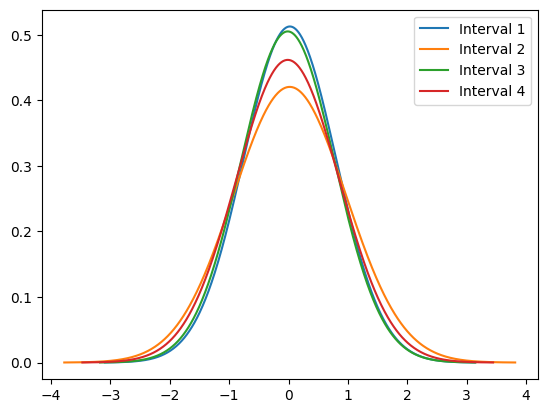

In [135]:
s1 = np.sqrt(v1)
s2 = np.sqrt(v2)
s3 = np.sqrt(v3)
s4 = np.sqrt(v4)
x1 = np.linspace(m1 - 4*s1, m1 + 4*s1, 1000)
x2 = np.linspace(m2 - 4*s2, m2 + 4*s2, 1000)
x3 = np.linspace(m3 - 4*s3, m3 + 4*s3, 1000)
x4 = np.linspace(m4 - 4*s4, m4 + 4*s4, 1000)
y1 = (1/(s1 * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x1 - m1)/s1)**2)
y2 = (1/(s2 * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x2 - m2)/s2)**2)
y3 = (1/(s3 * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x3 - m3)/s3)**2)
y4 = (1/(s4 * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x4 - m4)/s4)**2)
plt.plot(x1, y1, label="Interval 1")
plt.plot(x2, y2, label="Interval 2")
plt.plot(x3, y3, label="Interval 3")
plt.plot(x4, y4, label="Interval 4")
plt.legend()

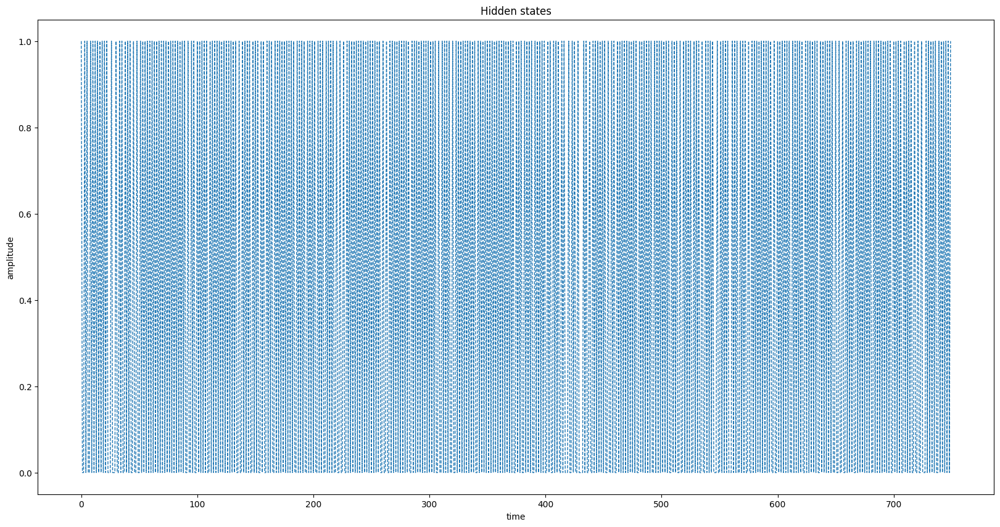

In [149]:
hidden_states_f2= train_categorical_hmm_with_floats(final_snore_signal_2[0:750], 2, 1000, 2)
plot_hidden_states(hidden_states_f2)
# plot_signal_hidden_states(final_snore_signal_2, hidden_states_f2_gaussian)  

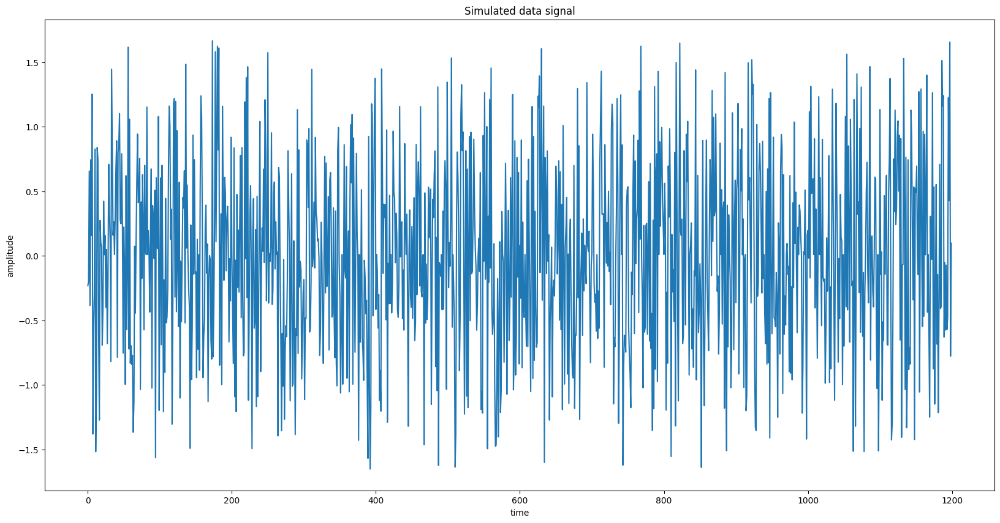

In [192]:
data2 = simulate_data(m1, v1, 360)
data2 = np.concatenate((data2, simulate_data(m2, v2, 240)))
data2 = np.concatenate((data2, simulate_data(m3, v3, 150)))
data2 = np.concatenate((data2, simulate_data(m4, v4, 450)))
thresholding_data = thresholding(data2, 2)
plot_signal("Simulated data", thresholding_data)

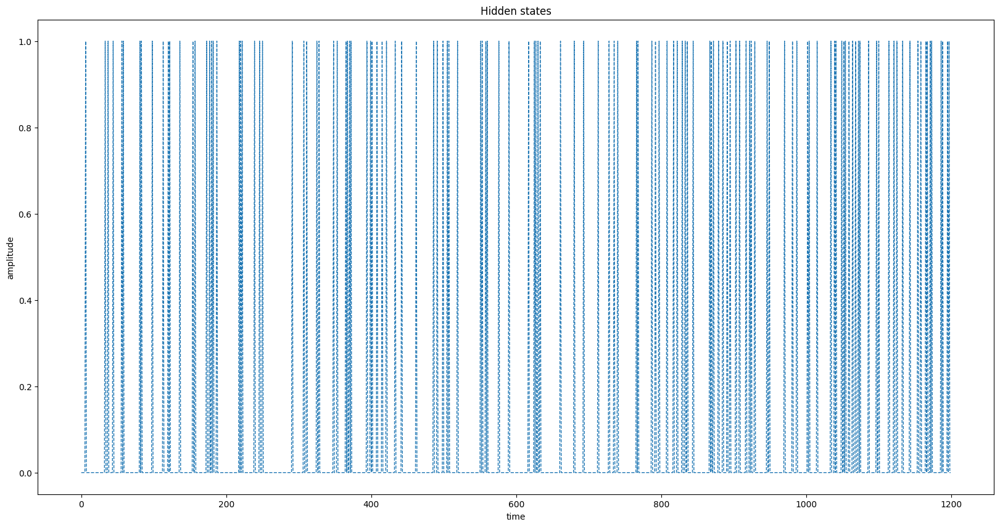

In [195]:
hidden_states_simulated2 = train_hmm(data2, 2, 1000)
plot_hidden_states(hidden_states_simulated2)

# on eeg data

5
1200


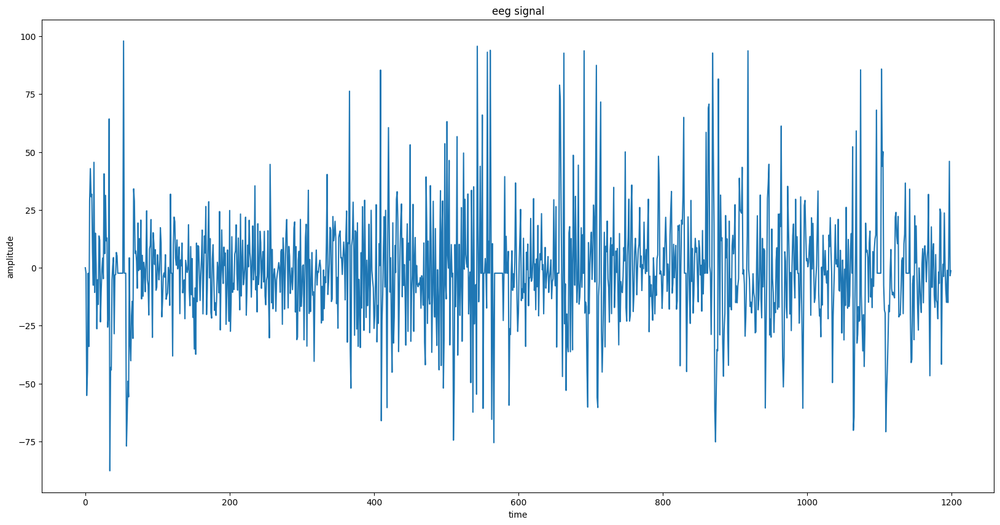

In [10]:
eeg_index = labels.index("EEG O1-A2")
print(eeg_index)

# eeg_signal = read_file_signal(edf_files_1[0], eeg_index)[360:11130]
eeg_signal_2 = combined_signal(edf_files_1, eeg_index)
eeg_signal_resampled_2 = resample_signal(eeg_signal_2, 36000)
eeg_signal_threshold_2 = thresholding(eeg_signal_resampled_2, 2)
final_eeg_signal_2 = eeg_signal_threshold_2[0:1200]
print(len(final_eeg_signal_2))
plot_signal("eeg", final_eeg_signal_2)

In [11]:
v1 = np.var(final_eeg_signal_2[0:360])
m1 = mean_of_interval(final_eeg_signal_2, 0, 360)
v2 = np.var(final_eeg_signal_2[360:600])
m2 = mean_of_interval(final_eeg_signal_2, 360, 600)
v3 = np.var(final_eeg_signal_2[600:750])
m3 = mean_of_interval(final_eeg_signal_2, 600, 750)
v4 = np.var(final_eeg_signal_2[750:1200])
m4 = mean_of_interval(final_eeg_signal_2, 750, 1200)
print(f"Variance 1: {v1}, Mean 1: {m1}")
print(f"Variance 2: {v2}, Mean 2: {m2}")
print(f"Variance 3: {v3}, Mean 3: {m3}")
print(f"Variance 4: {v4}, Mean 4: {m4}")

Variance 1: 353.12180212643307, Mean 1: -1.7753139368510906
Variance 2: 798.9776614981, Mean 2: -1.6886632250568991
Variance 3: 697.5326650202437, Mean 3: 0.06246871074860617
Variance 4: 568.9017078385373, Mean 4: -0.9017220552164141


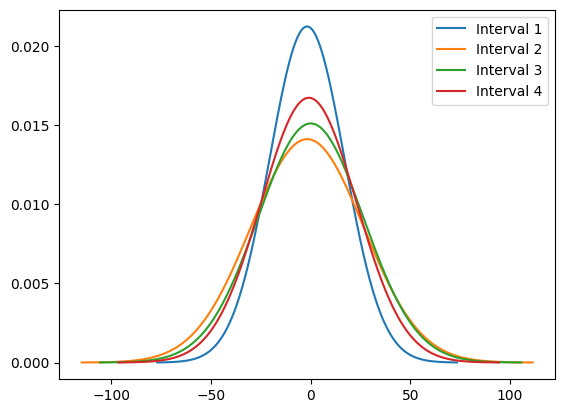

In [12]:
s1 = np.sqrt(v1)
s2 = np.sqrt(v2)
s3 = np.sqrt(v3)
s4 = np.sqrt(v4)
x1 = np.linspace(m1 - 4*s1, m1 + 4*s1, 1000)
x2 = np.linspace(m2 - 4*s2, m2 + 4*s2, 1000)
x3 = np.linspace(m3 - 4*s3, m3 + 4*s3, 1000)
x4 = np.linspace(m4 - 4*s4, m4 + 4*s4, 1000)
y1 = (1/(s1 * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x1 - m1)/s1)**2)
y2 = (1/(s2 * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x2 - m2)/s2)**2)
y3 = (1/(s3 * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x3 - m3)/s3)**2)
y4 = (1/(s4 * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x4 - m4)/s4)**2)
plt.plot(x1, y1, label="Interval 1")
plt.plot(x2, y2, label="Interval 2")
plt.plot(x3, y3, label="Interval 3")
plt.plot(x4, y4, label="Interval 4")
plt.legend()

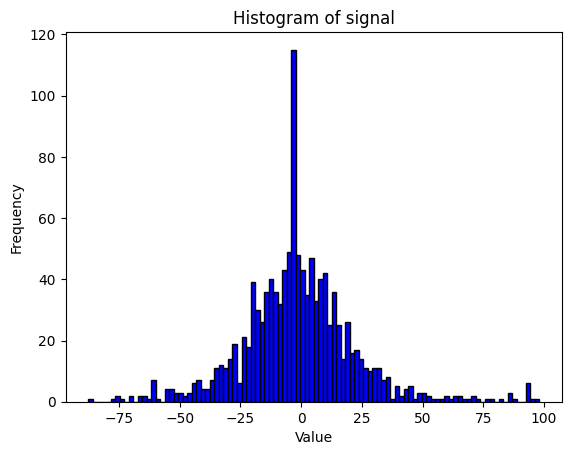

In [16]:
def plot_histogram(signal, bins):
    plt.hist(signal, bins=bins, color='blue', edgecolor='black')
    # plt.plot(m, s)
    plt.title("Histogram of signal")
    plt.xlabel("Value")
    plt.ylabel("Frequency")
    plt.show()

plot_histogram(final_eeg_signal_2, 100)

In [20]:
import scipy.stats as stats

def plot_histogram_with_gaussian(values, bins=50, title='Histogram with Gaussian Curve', xlabel='Values', ylabel='Frequency'):
    """
    Plots a histogram distribution of the given set of values and overlays a Gaussian curve.

    :param values: List of values to plot
    :param bins: Number of bins for the histogram
    :param title: Title of the histogram
    :param xlabel: Label for the x-axis
    :param ylabel: Label for the y-axis
    """
    # Plot histogram
    plt.figure(figsize=(10, 6))
    count, bins, ignored = plt.hist(values, bins=bins, density=True, edgecolor='black', alpha=0.6)

    # Calculate mean and standard deviation
    mean = np.mean(values)
    std_dev = np.std(values)

    # Plot Gaussian curve
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = stats.norm.pdf(x, mean, std_dev)
    plt.plot(x, p, 'k', linewidth=2)

    # Add titles and labels
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(True)
    plt.show()


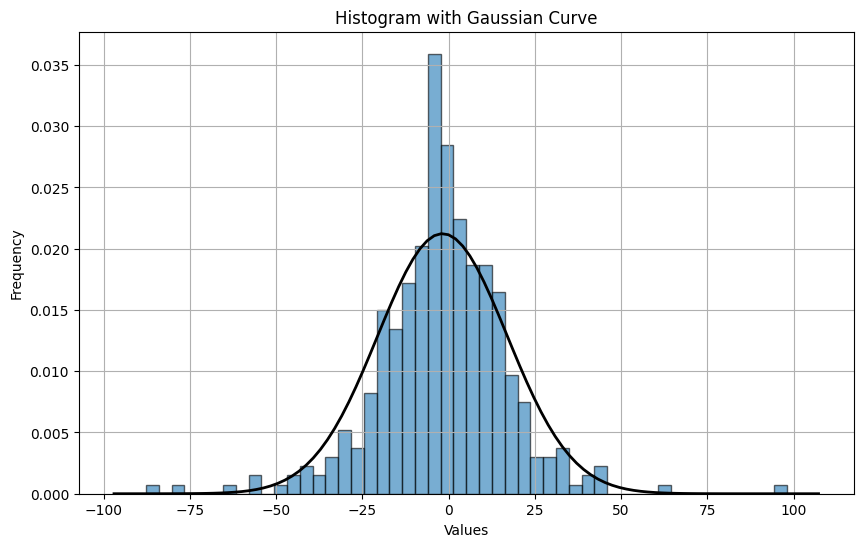

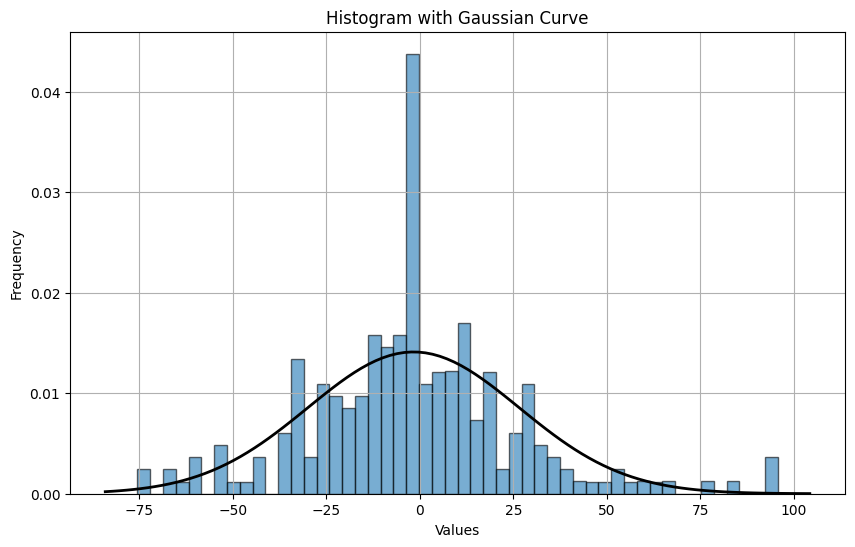

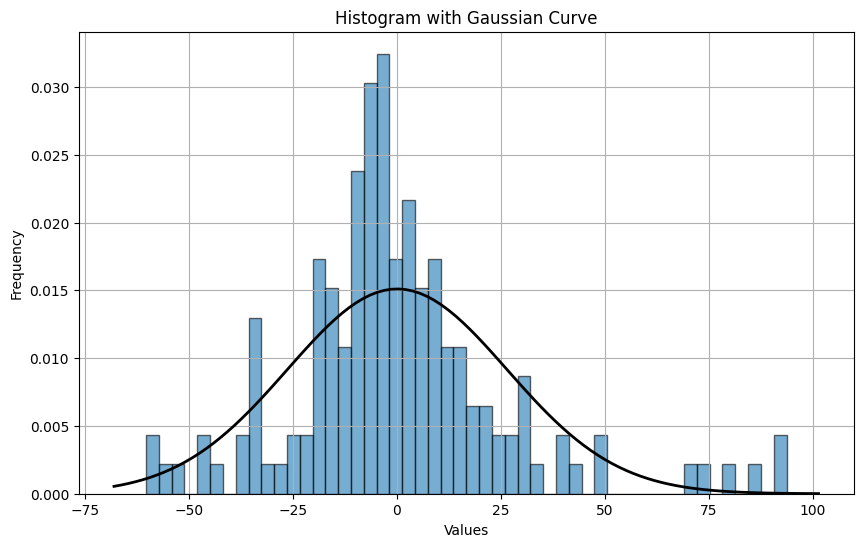

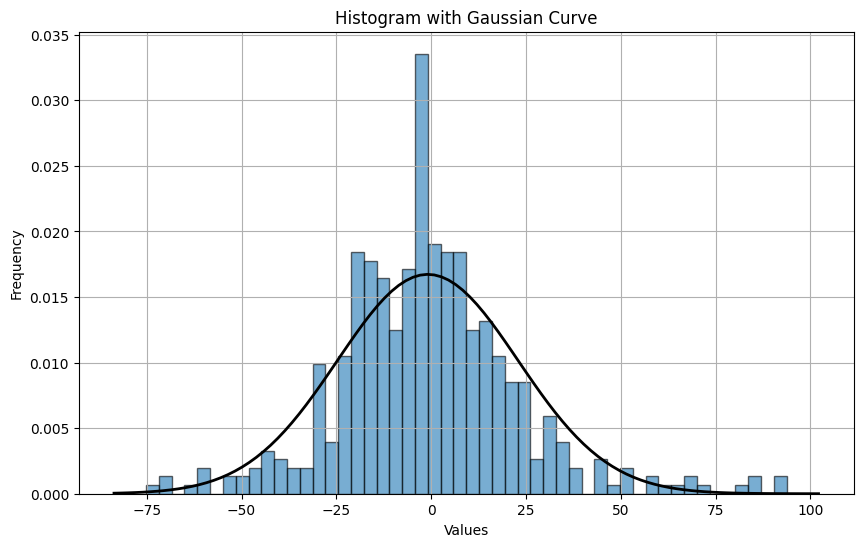

In [21]:
plot_histogram_with_gaussian(final_eeg_signal_2[0:360])
plot_histogram_with_gaussian(final_eeg_signal_2[360:600])
plot_histogram_with_gaussian(final_eeg_signal_2[600:750])
plot_histogram_with_gaussian(final_eeg_signal_2[750:1200])

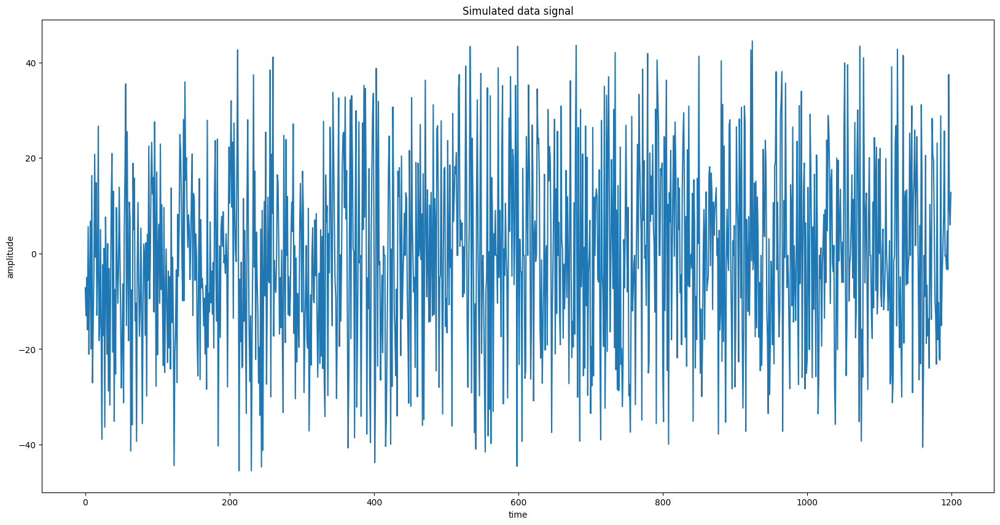

In [20]:
data3 = simulate_data(m1, v1, 360)
data3 = np.concatenate((data3, simulate_data(m2, v2, 240)))
data3 = np.concatenate((data3, simulate_data(m3, v3, 150)))
data3 = np.concatenate((data3, simulate_data(m4, v4, 450)))
thresholding_data = thresholding(data3, 2)
plot_signal("Simulated data", thresholding_data)

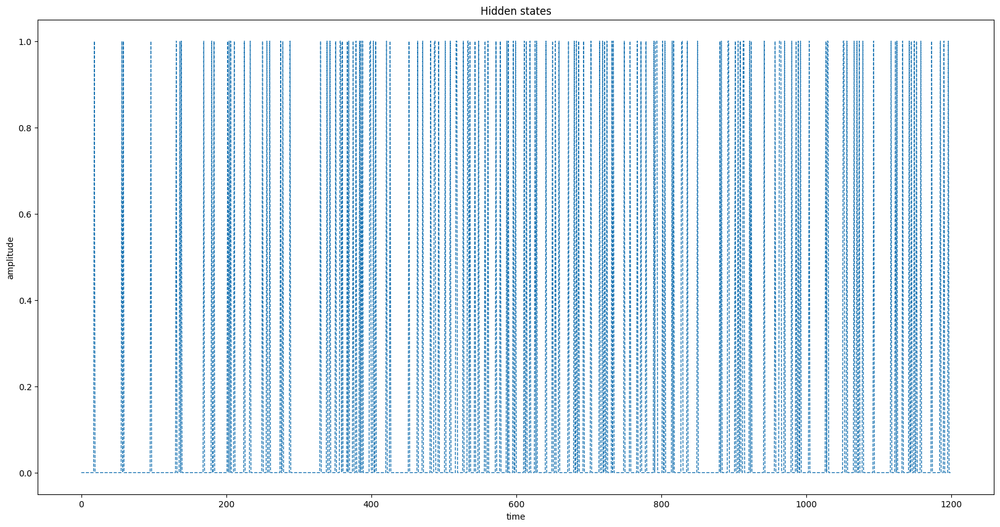

In [24]:
hidden_states_simulated2 = train_hmm(thresholding_data, 2, 1000)
plot_hidden_states(hidden_states_simulated2)